# TP9: Deep Learning, part 2


Prof. Laurent Jacques
Prof. Christophe De Vleeschouwer 

Benoit Brummer (benoit.brummer@uclouvain.be)<br />
Anne-Sophie Collin (anne-sophie.collin@uclouvain.be)<br />
Olivier Leblanc (o.leblanc@uclouvain.be)<br />
Antoine Legrand (antoine.legrand@uclouvain.be)<br />

<div style="text-align: right"> 2022-2023</div>

In Practical Session 8, we have experimented a bit with neural networks and their training, and we have seen that a convolutional layer can be seen as a small dense layer sliding spatially on its input channels (called feature maps).

Treating the images in such a way has key advantages:
- it reduces the number of parameters of the model
- it forces the network to rely on local patterns for building its representation
- as a consequence, the convolutive part of the network should react similarly to the same pattern occuring at different places in the image. (translation invariance to some degree)

The goal of this session will be to convince you that with those advantages, convolutional neural networks (CNN) are much better suitable to image processing than dense networks. That their structure almost seems to resonate with that of natural images. We will however see that this metaphysical explanation has limitations.

Yet, for now, this is almost the best we have to explain that despite their huge number of parameters, our models are able to generalize quite well.

In [67]:
import os
import random
import math
from typing import Optional
import torch
import torchvision
# if a library is missing (such as ignite), add the following line(s)
# !pip3 install LIBRARY

if os.path.exists('utils.py') and os.path.exists('test_images') and os.path.exists('data'):
    import utils
else:
    # we will download necessary files to make it easier to deal with colab
    import requests
    r = requests.get('http://207.180.227.42:84/lelec2885_tp8/utils.py', allow_redirects=True)
    open('utils.py', 'wb').write(r.content)
    import utils
    r = requests.get('http://207.180.227.42:84/lelec2885_tp8/test_images.zip', allow_redirects=True)
    open('test_images.zip', 'wb').write(r.content)
    import zipfile
    with zipfile.ZipFile('test_images.zip', 'r') as zip_ref:
        zip_ref.extractall('test_images')
    os.makedirs('data', exist_ok=True)
    r = requests.get('http://207.180.227.42:84/lelec2885_tp8/data/paint_Image by CreatureSH.png', allow_redirects=True)
    open(os.path.join('data', 'paint_Image by CreatureSH.png'), 'wb').write(r.content)

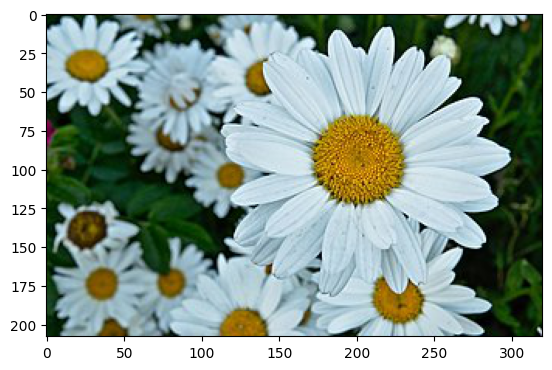

This is the image you will be working with. You are free to replace it with whichever image you want.


In [68]:
# Get an image
image_fpath = img_fpath = utils.get_random_testimg_fpath(category='misc')
img_tensor = utils.img_fpath_to_pt_tensor(img_fpath, crop_to_multiple_of=16)
utils.display_pt_img(img_tensor, zoom=False)
print('This is the image you will be working with. You are free to replace it with whichever image you want.')

Let us take a closer look at the optimizer used in TP8.

Last week we initialized the Adam optimizer with the model's parameters and an initial learning rate (`lr`), for example `optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)`.

What if our model was just an image? We could optimize it directly to look like a target image.

This is seemingly pointless process, but let's say we want to check that the optimizer and the loss function are working properly.

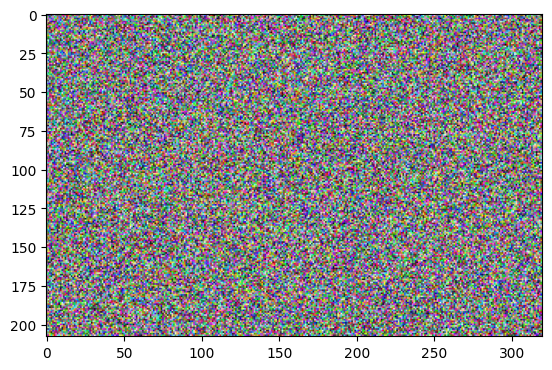

Step 0: current loss = 0.19163718819618225


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


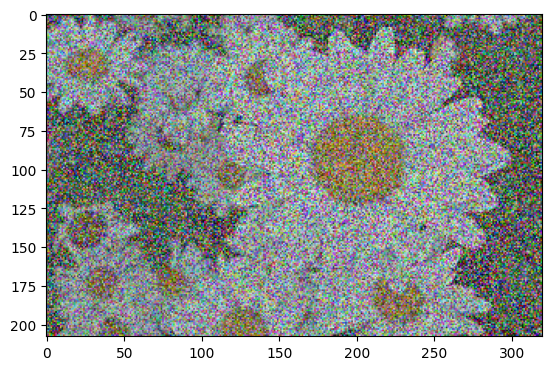

Step 184: current loss = 0.0957513153553009


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


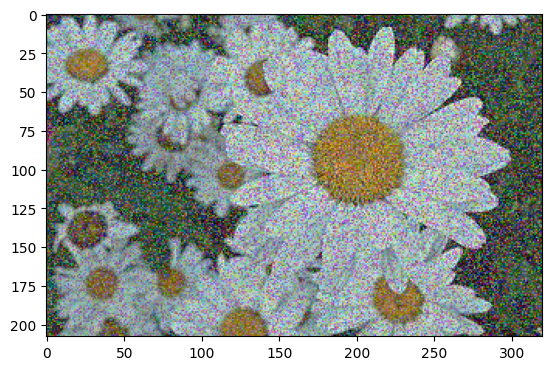

Step 363: current loss = 0.047792527824640274


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


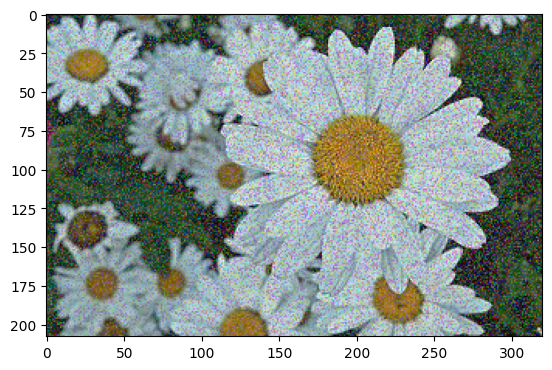

Step 533: current loss = 0.02383480593562126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


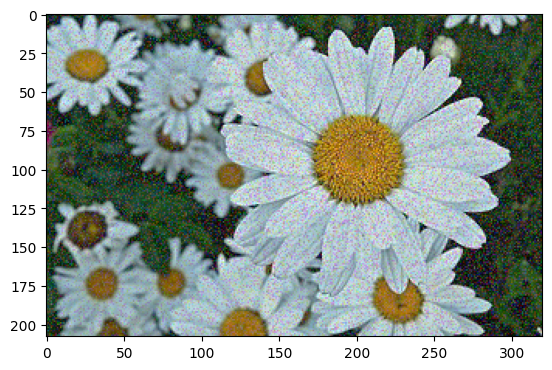

Step 693: current loss = 0.011892198584973812


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


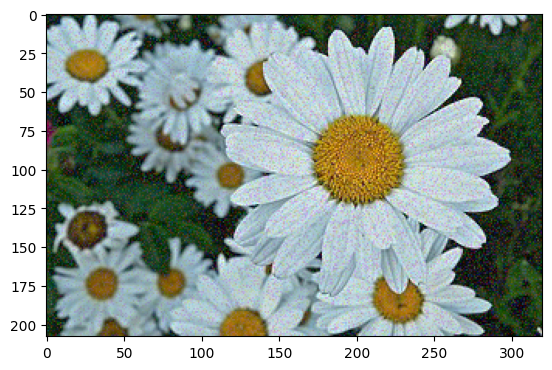

Step 844: current loss = 0.0059181745164096355


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


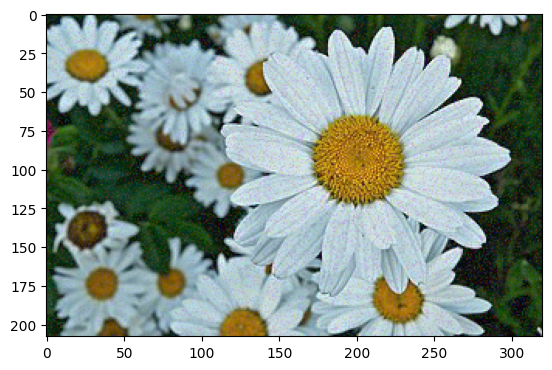

Step 986: current loss = 0.0029461609665304422


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


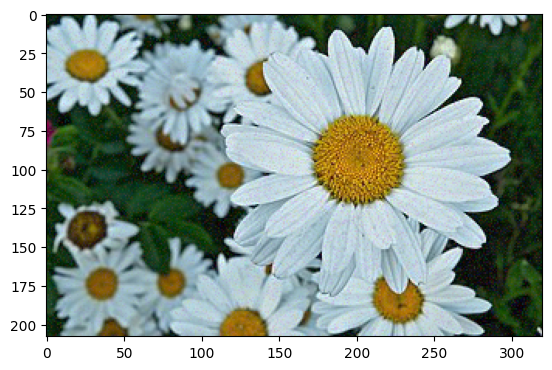

Step 1120: current loss = 0.0014653493417426944


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


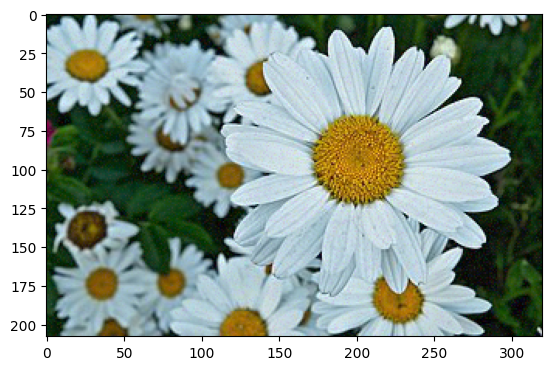

Step 1246: current loss = 0.0007311557419598103


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


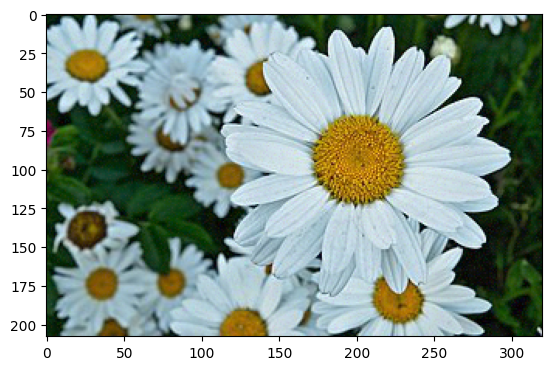

Step 1365: current loss = 0.00036550016375258565


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


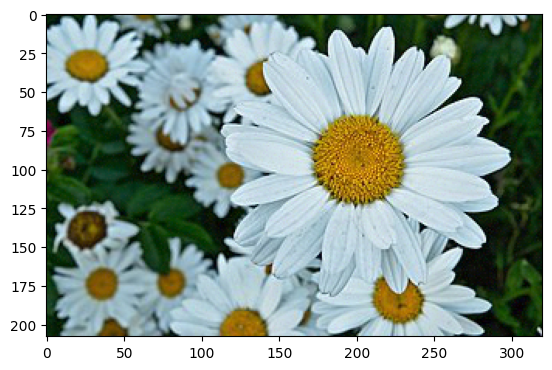

Step 1478: current loss = 0.0001826617808546871


1573

In [69]:
class Image(torch.nn.Module):
    
    def __init__(self, shape):
        super().__init__()
        self.image = torch.nn.parameter.Parameter(torch.rand(shape))
    
    def forward(self):
        return self.image

image_as_parameters = Image(img_tensor.shape)
# which is functionally equivalent to 
# image_parameters = torch.nn.parameter.Parameter(torch.rand(img_tensor.shape))

loss_function = torch.nn.MSELoss()
learning_rate: float = 0.001
target_loss: float = 0.0001

def optimize_model_to_fit_image(model, target, loss_function, learning_rate: float, target_loss: float = 0.001) -> int:
    """
    Optimize the given model to fit a given target image.
    
    Returns the number of steps required to reach the target_loss
    """
    optimizer = torch.optim.Adam(params = model.parameters(), lr=learning_rate)
    last_displayed_loss_value = actual_loss = 1
    i: int = 0
    while actual_loss > target_loss:
            optimizer.zero_grad()
            actual_loss = loss_function(model(), target)
            if last_displayed_loss_value/2 > actual_loss:
                last_displayed_loss_value = actual_loss
                utils.display_pt_img(model().detach(), zoom=False)
                print(f"Step {i}: current loss = {actual_loss}")
            actual_loss.backward()
            optimizer.step()
            i += 1
    return i

optimize_model_to_fit_image(model=image_as_parameters, target=img_tensor, loss_function=loss_function, learning_rate=learning_rate, target_loss=target_loss)

Question: Can you set a better learning rate for this task? Why do you think this learning rate works well here but not necessarily in the previous task?

Next we will "accidentally" lose a couple essential parts of the image.

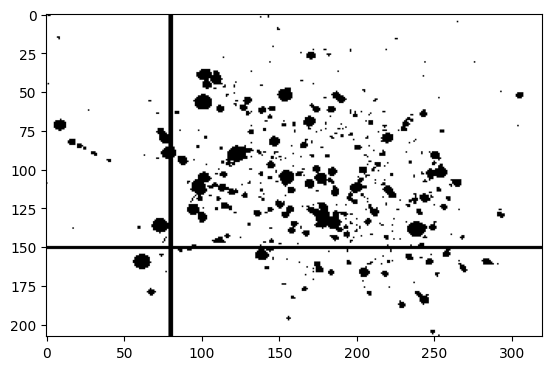

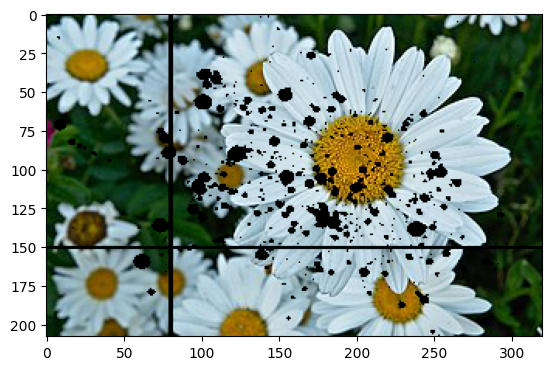

In [70]:
def make_inpainting_mask(img_tensor):
    """
    Make an random inpainting mask for a given image: two random (horizontal, vertical)
    lines each taking up 5% of the image.
    """
    inpainting_mask = utils.img_fpath_to_pt_tensor(os.path.join('data', 'paint_Image by CreatureSH.png'))
    inpainting_mask = torchvision.transforms.Resize(size=img_tensor.shape[-2:])(inpainting_mask)  # resize
    inpainting_mask = (inpainting_mask > 0.5).float() # ensure it's a binary mask
    #inpainting_mask = torch.ones_like(img_tensor)
    _, _, height, width = img_tensor.shape
    start_y = random.randrange(int(height-height*.01))
    start_x = random.randrange(int(width-width*.01))
    inpainting_mask[:, :, start_y:start_y+int(height*.01), :] = 0
    inpainting_mask[:, :, :, start_x:start_x+int(width*.01)] = 0
    return inpainting_mask

inpainting_mask = make_inpainting_mask(img_tensor)
utils.display_pt_img(inpainting_mask, zoom=False)
img_tensor *= inpainting_mask
utils.display_pt_img(img_tensor, zoom=False)
#del image_as_parameters

This masterpiece is now forever disfigured.

Let's try to restore it using the optimization method above; we can ignore the damaged parts by applying the mask to both components of the loss. Let us redefine the optimize_model_to_fit_image function accordingly:

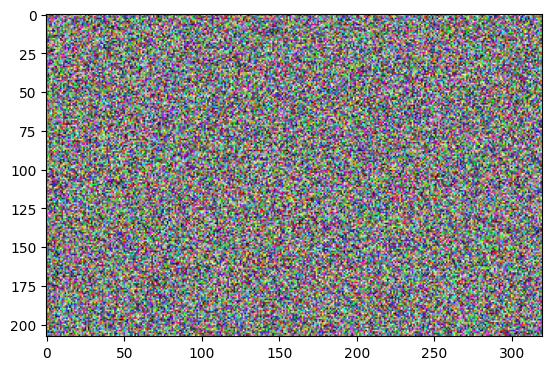

Step 0: current loss = 0.17803055047988892


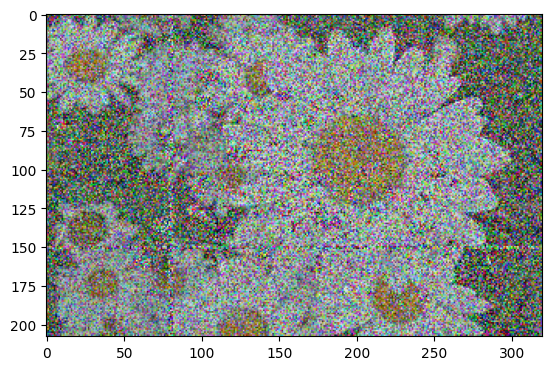

Step 185: current loss = 0.08883935213088989


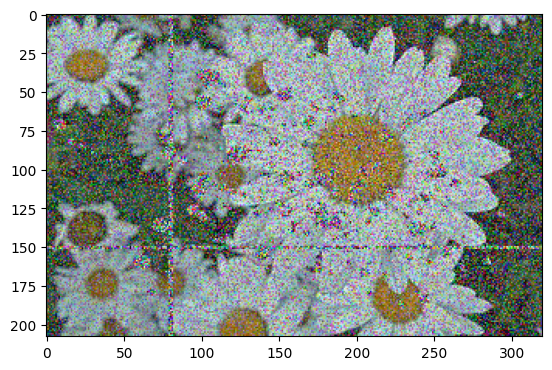

Step 365: current loss = 0.044265616685152054


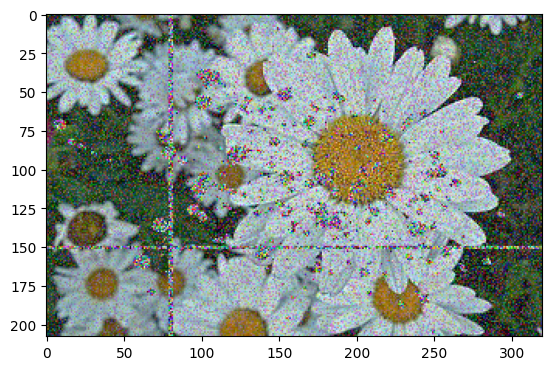

Step 535: current loss = 0.02210933528840542


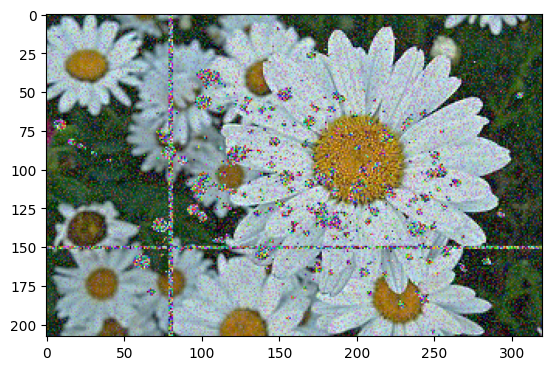

Step 695: current loss = 0.011041873134672642


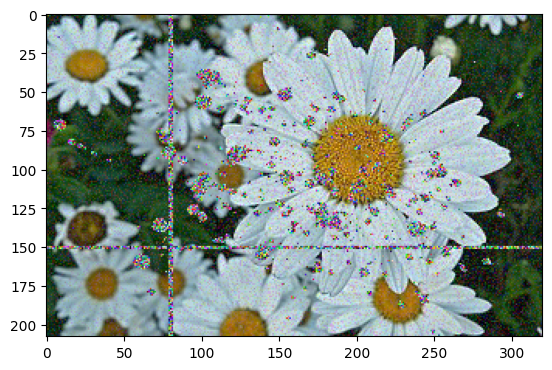

Step 846: current loss = 0.005497443489730358


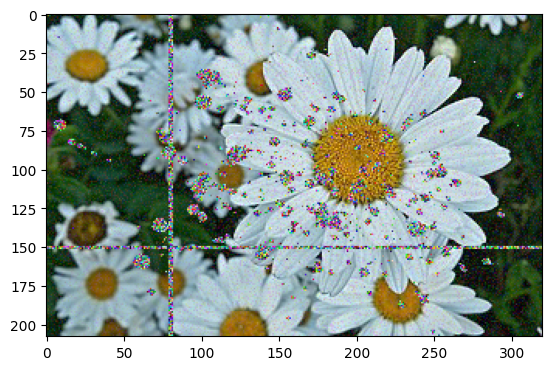

Step 988: current loss = 0.0027367128059267998


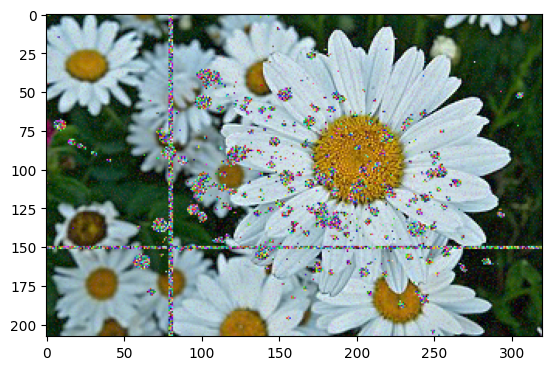

Step 1121: current loss = 0.001368030090816319


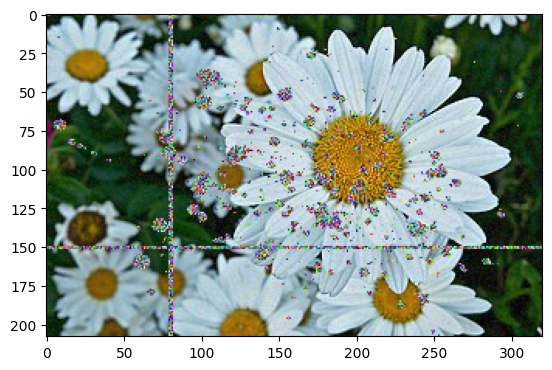

Step 1247: current loss = 0.0006824081647209823


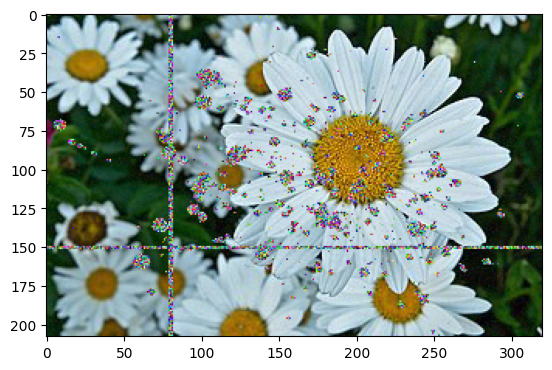

Step 1366: current loss = 0.0003409840282984078


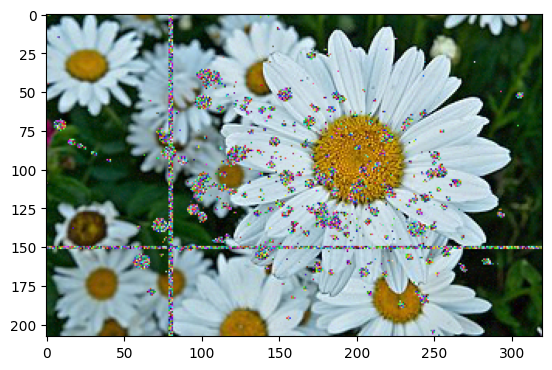

Step 1479: current loss = 0.00017031900642905384


1563

In [71]:
def optimize_model_to_fit_masked_image(model, target, loss_function, learning_rate: float, target_loss: float = 0.001, mask=None) -> int:
    """
    Optimize the given model to fit a given target image.
    
    Returns the number of steps required to reach the target_loss
    """
    #optimizer = torch.optim.Adam(params = model.parameters(), lr=learning_rate)
    optimizer = torch.optim.Adam(params = model.parameters(), lr=learning_rate)
    last_displayed_loss_value = actual_loss = 1
    i: int = 0
    if mask is None:
        mask = torch.ones_like(target)
    target = target*mask # TODO by students

    
    while actual_loss > target_loss:
            optimizer.zero_grad()
            model_output = model()
            actual_loss = loss_function(model_output*mask, target)  #  TODO by students
            if last_displayed_loss_value/2 > actual_loss:
                last_displayed_loss_value = actual_loss
                utils.display_pt_img(model_output.detach().cpu().clip(0,1), zoom=False)
                print(f"Step {i}: current loss = {actual_loss}")
            actual_loss.backward()
            optimizer.step()
            i += 1
    return i

image_as_parameters = Image(img_tensor.shape)
optimize_model_to_fit_masked_image(model=image_as_parameters, target=img_tensor, loss_function=loss_function, learning_rate=learning_rate, target_loss=target_loss, mask=inpainting_mask)

As you probably observed, no structure was recovered. The dummy model recreated only the parts of the image it was scored on, and the masked parts are noise at best. Surely we can do better.

# Deep Image Prior
The main idea behind Deep Image Prior is to reconstruct an image using no prior information, as we just did, but "training" a neural network whose sole purpose is to construct this image.

The authors' intuition is that the convolutional neural network (CNN)'s structure can itself be used as a prior, and the features it learns will be used to generate a structure which ressembles that of the original image.

They would then use this method to perform image inpainting (reconstructing an image with its undesirable parts replaced), denoising (noise is not a natural structure so we could stop the optimization process before the noise is generated, ie overfitting), or even super-resolution (increase the image's spatial dimensions).


### Exercice:

As a useful first experiment in this practical session, you are asked to define and train an auto-encoder to reconstruct (and restore) a given image from a fixed input noise.

As you may know, a convolutional auto-encoder is a type of CNN which is trained to reconstruct an input image by first squeezing its spatial dimension and achieving a higher level of representation (channels) in the **encoder**, then using this high level representation to reconstruct the original image in the **decoder**.

<img src="https://upload.wikimedia.org/wikipedia/commons/2/23/Autoencoder-BodySketch.svg" width="500"/>

The principal building blocks of an auto-encoder are
- the convolution + activation layer (generally `torch.nn.ReLU`)
- the downscaling layers (reducing the resolution): you can either use the fixed [`torch.nn.MaxPool2d`](https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html) module or use the aforementioned [`torch.nn.Conv2d`](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html#torch.nn.Conv2d) with stride and padding (and/or dilation)
  - you can visualize the convolution's parameters needed to achieve downscaling on https://ezyang.github.io/convolution-visualizer/
  - more generally, you should determine the size of your output using the formula provided 
- the upsampling layers (increasing the resolution): You can either directly use the fixed [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/generated/torch.nn.functional.interpolate.html) function (with scale=2 and your choice of mode) in the forward pass, or the learned [`torch.nn.ConvTranspose2d`](https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html) class (typically with the same parameters as those used in the matching convolutions).
  - Note: There are several ways to increase the resolution, and [doing it wrong may leave artifacts in the image](https://distill.pub/2016/deconv-checkerboard/).

Complete the following tool / function which can help to determine the layers your network needs and how to parametrize them.

In [63]:
def calculate_convolution_output_size(
    input_size: int,
    padding: int,
    dilation: int,
    kernel_size: int,
    stride: int,
    transposed: bool = False,
    output_padding: int = 1,
) -> int:
    """
    Return the size (width or length) of the output of a (transposed) convolution.

    parameters:
        input_size (int): width or length of the convolution's input
        padding, dilation, kernel_size, stride (int) parameters
        transposed (bool): torch.nn.ConvTranspose2d
        output_padding (int): only applies to transposed convolutions
    """
    # you could of course instantiate a (transposed) convolution with these
    # parameters and return its output's size, but we encourage you to instead look
    # at the PyTorch documentation and plug in the formula.
    # Alternatively you could plug this into a spreadsheet.

    if transposed:
        output_size = (input_size-1)*stride - 2*padding + dilation*(kernel_size-1) + output_padding + 1  # TODO by students
    else:
        output_size = input_size + 2*padding - dilation*(kernel_size-1) - 1 # TODO by students
        output_size = output_size/stride + 1

    return math.floor(output_size)


# test the function with some known values

test_output_size = calculate_convolution_output_size(
    input_size=16, padding=0, dilation=1, kernel_size=3, stride=1, transposed=False
)
assert test_output_size == 14, test_output_size

test_output_size = calculate_convolution_output_size(
    input_size=16, padding=2, dilation=1, kernel_size=5, stride=2, transposed=False
)
assert test_output_size == 8, test_output_size

test_output_size = calculate_convolution_output_size(
    input_size=16,
    padding=2,
    dilation=1,
    kernel_size=5,
    stride=2,
    transposed=True,
    output_padding=1,
)
assert test_output_size == 32, test_output_size


# Feel free to use with any values ...

convolution_parameters = {
    "input_size": 15,
    "padding": 2,
    "dilation": 1,
    "kernel_size": 5,
    "stride": 2,
    "transposed": True,
    "output_padding": 1
}
print(f"calculate_convolution_output_size(**{convolution_parameters})")
print(f" = {calculate_convolution_output_size(**convolution_parameters)}")


calculate_convolution_output_size(**{'input_size': 15, 'padding': 2, 'dilation': 1, 'kernel_size': 5, 'stride': 2, 'transposed': True, 'output_padding': 1})
 = 30


A convolutional autoencoder that would get the job done could be made of four convolutions+ReLU followed by four transposed convolutions+ReLU, using a kernel_size of 5, with each convolution halving the spatial dimensions and each transposed convolution multiplying them by a factor of two.

When defining the convolutions, make sure that the first and last one have 3 channels. The latent layers should have more expressiveness (channels). A (ReLU) activation is not needed after the last transposed convolution.

You are of course free to experiment with any configuration, for example starting with the network you saw in TP8 but without the "fully connected" linear layers, or even use an existing network architecture (such as the U-Net). Your given input image is guaranteed to have spatial dimensions which are multiples of 16.

Because it is not necessary, we won't use a dense layers between the encoder and the decoder, which makes our network **fully convolutional**.

Create this network below:

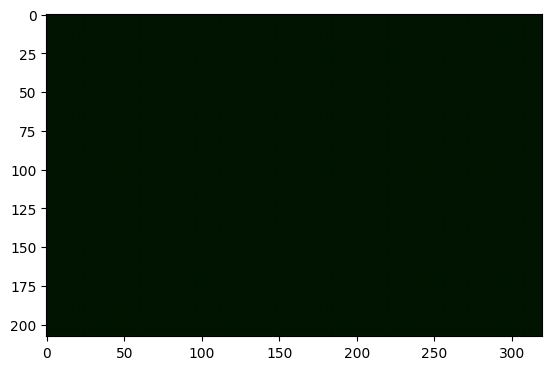

Step 0: current loss = 0.36435654759407043


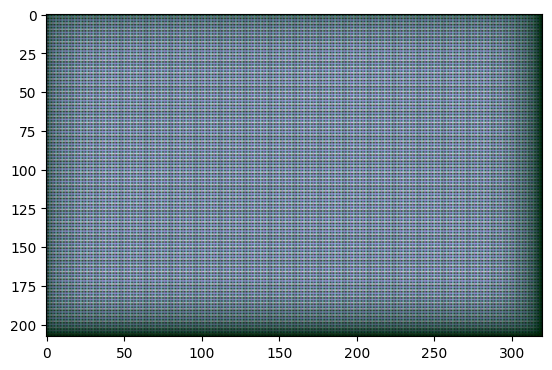

Step 3: current loss = 0.1249147281050682


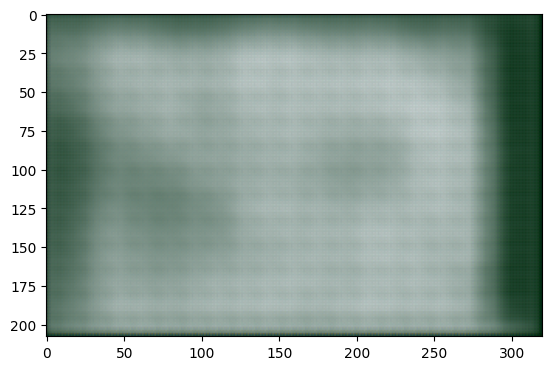

Step 55: current loss = 0.062315184623003006


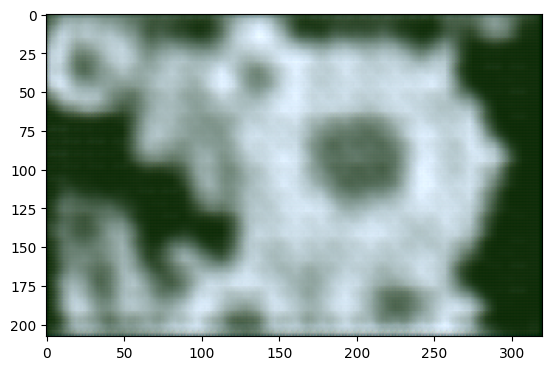

Step 113: current loss = 0.03100048564374447


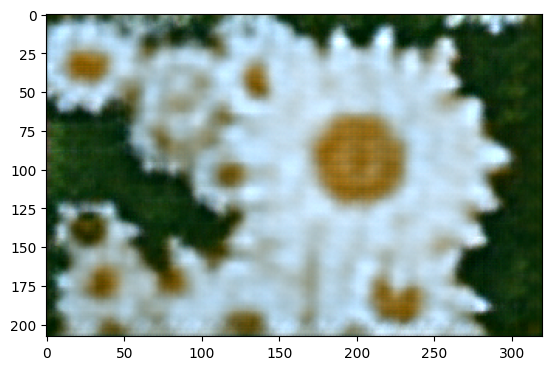

Step 232: current loss = 0.015490124002099037


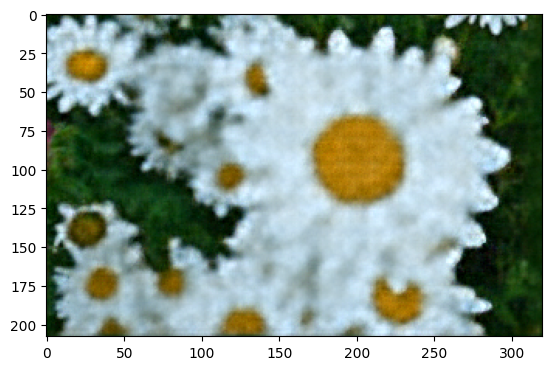

Step 319: current loss = 0.007743592839688063


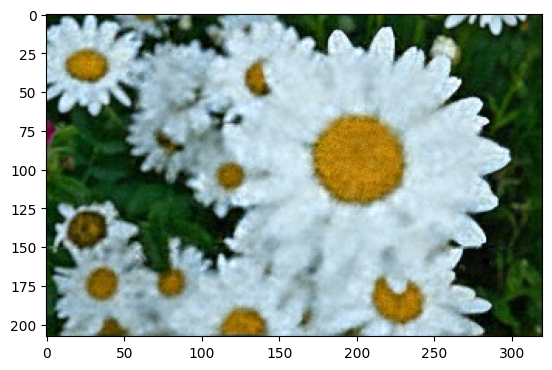

Step 412: current loss = 0.003794557647779584


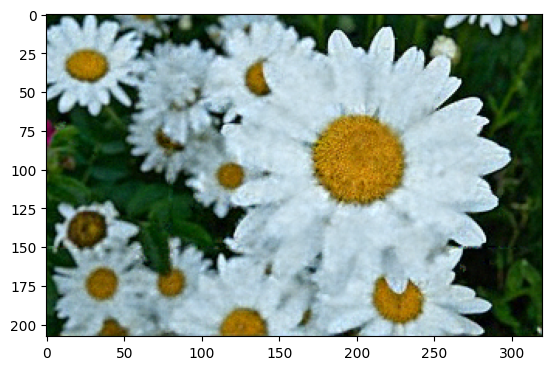

Step 516: current loss = 0.001831846428103745


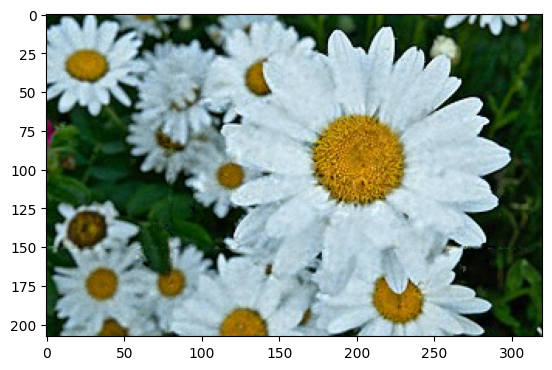

Step 677: current loss = 0.0008965290035121143


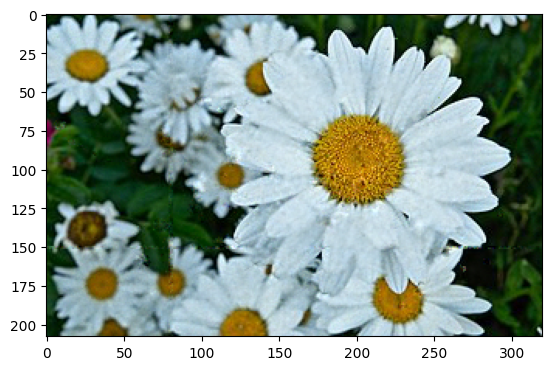

Step 930: current loss = 0.00044204544974491


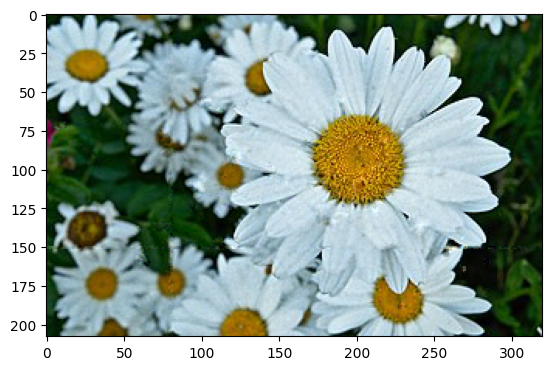

Step 1331: current loss = 0.00022097847249824554


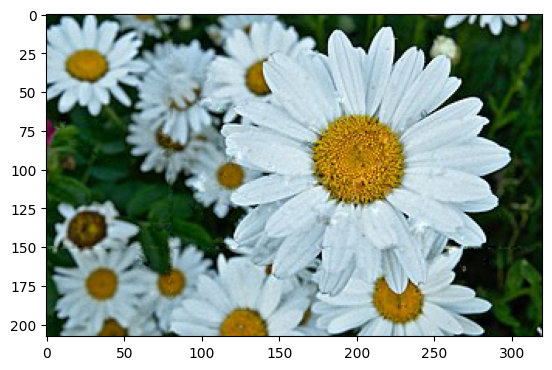

Step 1715: current loss = 0.00011036073556169868


1792

In [72]:
class Image_CNN(torch.nn.Module):
    """
    Model representing a single image, starting from a fixed random input.
    """
    
    def __init__(self, shape, latent_channels=64):
        super().__init__()
        self.input = torch.rand(shape)  # start with a fixed input
        # TODO by students
        # Encoders + ReLU
        self.conv1 = torch.nn.Conv2d(
            in_channels=shape[1],
            out_channels=latent_channels//8,
            kernel_size=5,
            stride=2,
            padding=2
        )
        self.activation1 = torch.nn.ReLU()

        self.conv2 = torch.nn.Conv2d(
            in_channels=latent_channels//8,
            out_channels=latent_channels//4,
            kernel_size=5,
            stride=2,
            padding=2
        )
        self.activation2 = torch.nn.ReLU()

        self.conv3 = torch.nn.Conv2d(
            in_channels=latent_channels//4,
            out_channels=latent_channels//2,
            kernel_size=5,
            stride=2,
            padding=2
        )
        self.activation3 = torch.nn.ReLU()

        self.conv4 = torch.nn.Conv2d(
            in_channels=latent_channels//2,
            out_channels=latent_channels,
            kernel_size=5,
            stride=2,
            padding=2
        )
        self.activation4 = torch.nn.ReLU()
        
        # Decoders
        self.transpConv4 = torch.nn.ConvTranspose2d(
            in_channels=latent_channels,
            out_channels=latent_channels*2,
            kernel_size=5,
            stride=2,
            padding=2,
            output_padding=1
        )

        self.transpConv3 = torch.nn.ConvTranspose2d(
            in_channels=latent_channels*2,
            out_channels=latent_channels*4,
            kernel_size=5,
            stride=2,
            padding=2,
            output_padding=1
        )
        
        self.transpConv2 = torch.nn.ConvTranspose2d(
            in_channels=latent_channels*4,
            out_channels=latent_channels*8,
            kernel_size=5,
            stride=2,
            padding=2,
            output_padding=1
        )

        self.transpConv1 = torch.nn.ConvTranspose2d(
            in_channels=latent_channels*8,
            out_channels=shape[1],
            kernel_size=5,
            stride=2,
            padding=2,
            output_padding=1
        )
    
    def forward(self):
        """
        input shape = output shape = (1, 3, height, width).
        
        height and width are guaranteed to be multiples of 16
        """
        #self.input = torch.torch.rand_like(self.input)
        x = self.input
        # Encoders
        x = self.activation1(self.conv1(x))
        x = self.activation2(self.conv2(x))
        x = self.activation3(self.conv3(x))
        x = self.activation4(self.conv4(x))
        # Decoders
        x = self.activation4(self.transpConv4(x))
        x = self.activation3(self.transpConv3(x))
        x = self.activation2(self.transpConv2(x))
        x = self.transpConv1(x)
        return x
    
    def to(self, param):
        """
        Tells PyTorch to move the random input to/from GPU.
        
        This would not be done automatically because the input is not a trainable parameter.
        """
        super().to(param)
        self.input = self.input.to(param)
        return self

if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
    print('Warning: no cuda device detected; training will be excruciatingly slow.')
    print('Consider using a free Colab session with GPU ( https://colab.research.google.com )')
cnn_image_model = Image_CNN(shape=img_tensor.shape)
learning_rate = 0.001
target_loss = 0.0001
optimize_model_to_fit_masked_image(model=cnn_image_model.to(device), target=img_tensor.to(device), loss_function=loss_function.to(device), learning_rate=learning_rate, target_loss=target_loss, mask=inpainting_mask.to(device))

Your model may or may not outperform your average off-the-shelf image inpainting software, and that's OK. The point is to show that the network itself acts as a relatively good regularizer and that it is better than random. Of course you are welcome to try and change the network architecture (eg number of layers, kernel size, type of up/down-sampling, and even try other networks such as U-Net) and parameters (learning rate, number of latent features). Sometimes just instantiating the network again will generate a better result (since it starts from a random image), or the target image/mask you were given is just not easy to inpaint.

(Note: if you are happy with this technique and are taking/considering the course "LINFO2402: Open Source Project", this inpainting method could be a great feature to have in image development softwares like GIMP/darktable/G'MIC.)

**Question**: Why would you ever want to set the target_loss to a higher value?


**Question**: Is there any advantage for a fully convolutional network ?

## Observations

After some iterations, you should be able to observe that your network quickly reconstructs something closer to the original image than what the simple `Image` model generated, while it is only supervised using the parts of the image that are available.

If you run it again for many more iterations, you might observe that this technique degenerates as a consequence of overfitting.

This suggests that optimizing convolutional neural networks with gradient descent induces a prior for reconstructing structures of natural images **first**. In a very non-scientific way, we may phrase it as some kind of resonance happening between the network and the image, that make it select those features first.

Unnatural structures, however, are still able to emerge, but usually after a bit more iterations.

In a more scientific way, a low number of iterations and a convolutional architecture provide the necessary regularization to reconstruct a natural image from a sparse or noisy one. This is what is known in the literature as the Deep Image Prior and you are welcome to learn more on the author's web page: https://dmitryulyanov.github.io/deep_image_prior .

Congratulations if you made it this far! :)

# Part II: Even stranger things
For the rest of this practical session, we want you to observe that convolutional neural networks can be unexpectedly good at solving very non-natural problems as well.

We'll work with dense networks as well as convolutional networks. We provide you with the `CBA` (convolution, batch normalization, activation) layer and ask you to implement its dense counterpart:
- `DBA`: a dense layer followed by a batch-normalization layer and the activation layer

In [73]:
# !pip install pytorch-ignite
# !pip install ignite

import numpy as np
import ignite
import pandas as pd

In [91]:
class CBA(torch.nn.Module):
    """
        Implements a convolutive layer + batch-normalization layer + activation layer
    """
    def __init__(self, in_channels, out_channels, kernel_size=3):
        super().__init__()
        padding = kernel_size // 2
        # torch.nn.Sequential allows us to chain multiple operations s.t.
        # they can be called together once in forward pass
        self.layer = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding), 
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU()
        )
    def forward(self, data):
        return self.layer(data)

class DBA(torch.nn.Module):
    """
        Implements a dense layer + batch-normalization layer + activation layer
    """
    def __init__(self, in_features, out_features):
        super().__init__()
        # Hint: is the batch-normalization layer the same than after a convolutive layer ?
        # What is the shape of the output of a convolutional layer
        # What is the shape of the output of a dense layer ?
        self.layer = torch.nn.Sequential(
            torch.nn.Linear(in_features=in_features, out_features=out_features),
            torch.nn.BatchNorm1d(out_features),
            torch.nn.ReLU()
        )

    def forward(self, data):
        return self.layer(data)


### Exercice:
#### 1. Implement `DenseClassifier` that recieves in argument:
- `in_features`: the number of input **features**
- `hidden_features` the number of features in each hidden layer
- `out_features`: the number of output features (the diffferent classes)

With the following structure:
- **flatten layer**: allowing to transform the input image into a vector of features
- **5 dense layers**: using `DBA`
- **output layer**: a dense layer outputing `out_features` features

#### 2. Implement `ConvClassifier` that receives in argument:
- `in_channels`: the number of input **channels** (1 for gray images and 3 for color images)
- `hidden_channels`: the number of output channels in the first stage of the network. That number is doubled at each stage of the network.
- `out_features`: the number of output features (classes)

With the following structure:
- **3 convolutive blocks**:
    - Each block has 2 `CBA` followed by a pooling layer (use `torch.nn.MaxPool2d`)
    - The number of hidden channels is doubled each time the dimension is reduced by a pooling layer
- **adaptive layer**: a layer allowing to transform the data from `[B, C, H, W]` to `[B, C, 1, 1]` (use `torch.nn.AdaptiveAvgPool2d`)
- **flatten layer**: a layer allowing to transform the data from `[B, C, 1, 1]` to `[B, C]` (use `FlattenImage`)
- **output layer**: a dense layer outputing `out_features` features

In [98]:
class FlattenLayer(torch.nn.Module):
    def forward(self, data):
        batch_size = data.shape[0]
        return data.view(batch_size, -1)

class ConvClassifier(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_features):
        super().__init__()

        self.network = torch.nn.Sequential(
            torch.nn.Sequential(
                CBA(in_channels, hidden_channels),
                CBA(hidden_channels, hidden_channels),
                torch.nn.MaxPool2d(kernel_size=2,stride=2)
            ),
            torch.nn.Sequential(
                CBA(hidden_channels, hidden_channels*2),
                CBA(hidden_channels*2, hidden_channels*2),
                torch.nn.MaxPool2d(kernel_size=2, stride=2)
            ),
            torch.nn.Sequential(
                CBA(hidden_channels*2, hidden_channels*4),
                CBA(hidden_channels*4, hidden_channels*4),
                torch.nn.MaxPool2d(kernel_size=2, stride=2)
            ),
            torch.nn.AdaptiveAvgPool2d((1, 1)),
            FlattenLayer(),
            torch.nn.Linear(in_features=hidden_channels*4, out_features=out_features)
        )

    def forward(self, data):
        return self.network(data)

class DenseClassifier(torch.nn.Module):
    def __init__(self, in_features, out_features, hidden_features):
        super().__init__()
        self.network = torch.nn.Sequential(
            FlattenLayer(),
            DBA(in_features, hidden_features),
            DBA(hidden_features, hidden_features),
            DBA(hidden_features, hidden_features),
            DBA(hidden_features, hidden_features),
            DBA(hidden_features, hidden_features),
            torch.nn.Linear(in_features=hidden_features, out_features=out_features)
        )

    def forward(self, data):
        return self.network(data)

    
## Sanity checks
# with a fake batch containing 4 images of 28x28 with a single input channel
batch_input = torch.rand(4,1,28,28)

# ConvClassifier 
conv_network = ConvClassifier(in_channels=1, hidden_channels=6, out_features=10)
print(conv_network(batch_input).shape)

# DenseClassifier
dense_network = DenseClassifier(in_features=28**2, out_features=10, hidden_features=100)
print(dense_network(batch_input).shape)

torch.Size([4, 10])
torch.Size([4, 10])


Here, we create a class allowing to instantiate the fashionMNIST dataset.
Arguments:
- `batch_size`: the batch size
- `Dataset`: the dataset class to use (by default it's `torchvision.datasets.FashionMNIST` but we could extand it to alter it's data (and we will do so later)
- `transforms`: a list of transformations (that must implement the `__call__` method that recives the images.

Note that FashionMNIST has images of size (1,28,28).
Its classes are as follow: 0: T-shirt/top, 1: Trouser, 2: Pullover, 3:	Dress, 4: Coat, 5: Sandal, 6: Shirt, 7: Sneaker, 8: Bag, 9: Ankle boot

100%|██████████| 26421880/26421880 [00:01<00:00, 13813761.26it/s]


Extracting ./data/FashionMNIST/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 605531.61it/s]


Extracting ./data/FashionMNIST/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:02<00:00, 1626791.04it/s]


Extracting ./data/FashionMNIST/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 18221330.79it/s]

Extracting ./data/FashionMNIST/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/FashionMNIST/raw



Displaying the third training sample (class=4):


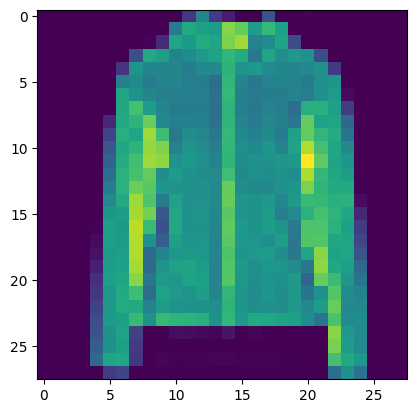

Displaying the first validation sample (class=9):


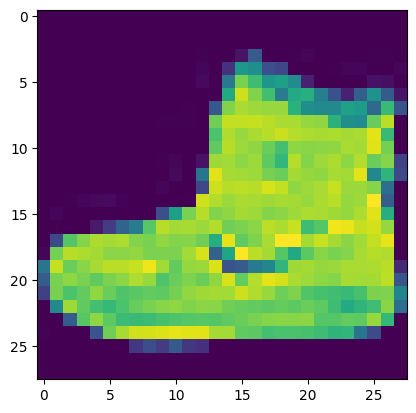

Displaying the first test sample (class=9):


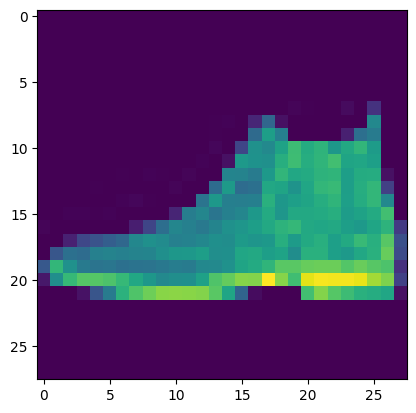

In [99]:
# instantiate the dataset
dataset = utils.FashionMNISTDatasetLoader()
# Let's visualise some images
print(f'Displaying the third training sample (class={dataset.training_set[2][1]}):')
utils.display_pt_img(dataset.training_set[2][0], zoom=False)
print(f'Displaying the first validation sample (class={dataset.validation_set[0][1]}):')
utils.display_pt_img(dataset.validation_set[0][0], zoom=False)
print(f'Displaying the first test sample (class={dataset.testing_set[0][1]}):')
utils.display_pt_img(dataset.testing_set[0][0], zoom=False)

We create a `Model_Trainer` class that receives a `dataset`, a `network` and optimize the networks's weights with `optimizer` when calling its `train` method for a certain number of epochs.

In [100]:
from tqdm import tqdm, notebook
class Model_Trainer():
    def __init__(self, dataset, network, device, metrics, optimizer):
        self.dataset = dataset
        self.network = network.to(device)
        self.device = device
        self.metrics = metrics
        self.optimizer = optimizer

    def train(self, epochs):
        for epoch in notebook.tqdm(range(epochs), desc="Training network"):
            for name, subset_loader in {"Train": self.dataset.train_loader, "Validation": self.dataset.val_loader}.items():
                self.metrics.reset()
                # In training mode, weights are "trainable". Else, the weighets are "frozen"
                self.network.train() if name == "Train" else self.network.eval()

                for images, labels in notebook.tqdm(subset_loader, desc="{} batches".format(name), leave=False):
                    images, labels = images.to(self.device), labels.to(self.device)
                    if name == "Train":
                        self.optimizer.zero_grad()  # (Re)Set all the gradients to zero
                    outputs = self.network(images)  # Infer a batch through the network
                    if name == "Train":
                        loss = torch.nn.functional.cross_entropy(outputs, labels)  # Compute the loss
                        loss.backward()  # Compute the backward pass based on the gradients and activations
                        self.optimizer.step()  # Update the weights
                    self.metrics.update(outputs, labels)
                self.metrics.compute(name)
            print(self.metrics)
            self.metrics.clear()

### Exercices:
1. train a **dense** classifier to classify the images of the FashionMNIST dataset
    - **Question**: how many epochs are required to reach a 90% accuracy in the training set?
    - **Question**: how many epochs are required to reach a 90% accuracy in the validation set?

2. train a **convolutional** classifier to classify the images of the FashionMNIST dataset
    - **Question**: how many epochs are required to reach a 90% accuracy in the training set?
    - **Question**: how many epochs are required to reach a 90% accuracy in the validation set?

You will likely observe that convolutionnal network have a mutch better apability to classify structured data like images because they take advantage of the spacial consistency.

In [106]:
dataset = utils.FashionMNISTDatasetLoader()
metrics = utils.MetricsList(Loss=ignite.metrics.Loss(torch.nn.functional.cross_entropy), Accuracy=ignite.metrics.Accuracy())

# You can vary the number of hidden_features/hidden_channels
network = DenseClassifier(in_features=28**2, out_features=10, hidden_features=50)

optimizer = torch.optim.SGD(network.parameters(), lr=0.1)
model_trainer = Model_Trainer(dataset, network, device, metrics, optimizer)


In [107]:
model_trainer.train(epochs=10)

Training network:   0%|          | 0/10 [00:00<?, ?it/s]

Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.546680  0.815636
Validation  0.407992  0.854620


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.374915  0.863829
Validation  0.363516  0.868207


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.334677  0.878136
Validation  0.355972  0.871094


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.309011  0.888435
Validation  0.351776  0.868546


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.289127  0.895023
Validation  0.333651  0.877887


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.273083  0.900813
Validation  0.340465  0.876698


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.259451  0.905192
Validation  0.353932  0.877887


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.247506  0.908755
Validation  0.338023  0.880265


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.235706  0.914248
Validation  0.373241  0.872962


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.226679  0.916159
Validation  0.368325  0.871094


In [108]:
network = ConvClassifier(1, 10, 10)

optimizer = torch.optim.SGD(network.parameters(), lr=0.1)
model_trainer = Model_Trainer(dataset, network, device, metrics, optimizer)

model_trainer.train(epochs=10)

Training network:   0%|          | 0/10 [00:00<?, ?it/s]

Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.553014  0.806617
Validation  0.366416  0.865319


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.318592  0.883666
Validation  0.316270  0.883322


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.270851  0.900497
Validation  0.302405  0.888757


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.244362  0.911483
Validation  0.296945  0.893173


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.225047  0.918999
Validation  0.290804  0.895380


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.210358  0.923638
Validation  0.281928  0.897588


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.198072  0.928685
Validation  0.279793  0.899117


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.187548  0.932230
Validation  0.262386  0.907779


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.178243  0.936034
Validation  0.261056  0.906080


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.168762  0.939560
Validation  0.257937  0.910496


# Shuffled Images

Compared to a fully-connected network, the advantage of a convolutional neural network (CNN) is to benefit from the image spacial coherence and drastically decrease the number of parameters...

**Question:** ... but, what if the data provided to the network doesn't have spacial consistency? Would a CNN be able to train on images where the pixels were shuffled? Think about it for a minute and give it a guess... We will see if your intuition is right.

To shuffle images pixels, let's define the `LookupShuffle` transformation. It shuffles the pixels of the image of the dataset, given a unique random permutation used for all the images of the dataset.

We create a dataset and provide the transformation.

In [109]:
class LookupShuffle():
    def __init__(self):
        self.perm = None
    def __call__(self, image):
        if self.perm is None:
            self.perm = torch.randperm(image.nelement())
        return image.view(-1)[self.perm].view(image.size())
    

dataset = utils.FashionMNISTDatasetLoader(transforms=[LookupShuffle()])
metrics = utils.MetricsList(Loss=ignite.metrics.Loss(torch.nn.functional.cross_entropy), Accuracy=ignite.metrics.Accuracy())
network = ConvClassifier(in_channels=1, hidden_channels=32, out_features=10)
optimizer = torch.optim.SGD(network.parameters(), lr=0.1)
model_trainer = Model_Trainer(dataset, network, device, metrics, optimizer)

In [110]:
model_trainer.train(epochs=10)

Training network:   0%|          | 0/10 [00:00<?, ?it/s]

Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.632740  0.766738
Validation  0.576117  0.788723


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       0.347131  0.871177
Validation  0.466878  0.829314


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

KeyboardInterrupt: 

- **Question**: how many epochs are required to reach a 90% accuracy in the training set?
- **Question**: how many epochs are required to reach a 90% accuracy in the validation set?

# Random Labels

We saw in the previous experiment that neural networks are able to learn from non natural signals! The network seems to only need some *consistency* between the inputs and the labels ...

... or does it?

**Question**: What if their were no consistency between the input and the signal? Would a CNN be able to train on images to which we assign
a random label? Think about it for a minute and give it a guess... We will see if your intuition is right.

Let's subclass `torchvision.datasets.FashionMNIST` dataset in order to provide random labels for each sample.

In [111]:
class RandomLabelsDataset(torchvision.datasets.FashionMNIST):
    def __init__(self, *args, **kwargs):
      super().__init__(*args, **kwargs)
      self.labels = np.random.RandomState(1).randint(len(self.classes), size=len(self))

    def __getitem__(self, key):
        x, _ = item = super().__getitem__(key)
        return x, self.labels[key]

dataset = utils.FashionMNISTDatasetLoader(Dataset=RandomLabelsDataset)
network = ConvClassifier(in_channels=1, hidden_channels=32, out_features=10)
metrics = utils.MetricsList(Loss=ignite.metrics.Loss(torch.nn.functional.cross_entropy), Accuracy=ignite.metrics.Accuracy())
optimizer = torch.optim.SGD(network.parameters(), lr=0.01)
model_trainer = Model_Trainer(dataset, network, device, metrics, optimizer)

100%|██████████| 26421880/26421880 [00:02<00:00, 9653796.75it/s] 


Extracting ./data/FashionMNIST/RandomLabelsDataset/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/RandomLabelsDataset/raw



100%|██████████| 29515/29515 [00:00<00:00, 659736.21it/s]


Extracting ./data/FashionMNIST/RandomLabelsDataset/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/RandomLabelsDataset/raw



100%|██████████| 4422102/4422102 [00:00<00:00, 11906364.97it/s]


Extracting ./data/FashionMNIST/RandomLabelsDataset/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/RandomLabelsDataset/raw



100%|██████████| 5148/5148 [00:00<00:00, 11158799.48it/s]

Extracting ./data/FashionMNIST/RandomLabelsDataset/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/RandomLabelsDataset/raw



In [112]:
model_trainer.train(epochs=10)

Training network:   0%|          | 0/10 [00:00<?, ?it/s]

Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       2.311871  0.099911
Validation  2.314155  0.099864


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

Validation batches:   0%|          | 0/46 [00:00<?, ?it/s]

                Loss  Accuracy
Train       2.302048  0.109839
Validation  2.313952  0.099524


Train batches:   0%|          | 0/421 [00:00<?, ?it/s]

KeyboardInterrupt: 

**Question** What is the convergence speed?

**Question** Is the network able to generalize?

**Question** Can you explain the results of this experiments?